<a id="section-one"></a>
# 1. Introduction 

This notebook is going to focus on **exploratory data analysis**, **condition monitoring or fault detection** of equipments being used and **prediction of power generation**
in a solar power plant.


## 1.1 Solar Power Plants

In general, solar power plants convert sunlight energy into electrical energy. 

**Explanation of the devices used in a solar power plant :-**
- **Solar Cell** - It is also called photovoltaic cell, it is a device that directly converts the energy of light into electrical energy through the photovoltaic effect.

- **Solar Panel** - solar panel contain multiple solar cells connected in a series of parallel circuits which create a solar module.

- **Solar Module** - Solar panels create a solar module. Solar modules seal the solar cells and wiring in a protective case to guard them against weather conditions.

- **The Process of Power Generation :-** When sunlight arrives on the surface of the earth, we recieve them by using solar modules, solar panels(photovoltaic cells) on the solar modules absorb the sunlight(also called Irradiation) and generate DC Power, this DC Power is then converted into AC Power with the use of inverters.
- **Photovoltaic Cells**, where the photovoltaic effect (photon absorption leads to injection of excited electrons into the conduction band) is employed to generate direct current (DC) power which is then converted into alternating current (AC) power by the use of inverters.



## 1.2 Dataset Description
According to the dataset description, the data contains two sets of information about a solar power plants located in India, that were acquired over a period of 34 days:
- power generation data  (measured at the inverter, each inverter corresponding to multiple lines of solar panels)
- weather data (measured with a single line of sensors optimally placed at the plant)

## 1.3 The challenges
1. Can we **predict the power generation for next couple of days**?
2. Can we **identify the need for panel cleaning/maintenance**?
3. Can we **identify faulty or suboptimally performing equipment**?

# 2. Import & Preprocessing

### 2.1 Import required libraries

In [1]:
import os
import pandas as pd
import numpy as np
import datetime
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.dates as mdates 
xformatter = mdates.DateFormatter('%H:%M')

import sklearn
from scipy.optimize import curve_fit

import warnings
warnings.filterwarnings('ignore')

### Load the datasets

In [2]:
df_gen = pd.read_csv("Plant_1_Generation_Data.csv")
df_weather = pd.read_csv("Plant_1_Weather_Sensor_Data.csv")

#### Check column values from all the datasets

In [3]:
for df in [df_gen,df_weather]:   
    print(df.columns.values.tolist())

['DATE_TIME', 'PLANT_ID', 'SOURCE_KEY', 'DC_POWER', 'AC_POWER', 'DAILY_YIELD', 'TOTAL_YIELD']
['DATE_TIME', 'PLANT_ID', 'SOURCE_KEY', 'AMBIENT_TEMPERATURE', 'MODULE_TEMPERATURE', 'IRRADIATION']


In [4]:
df_gen

,DATE_TIME,PLANT_ID,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD
0,15-05-2020 00:00,4135001,1BY6WEcLGh8j5v7,0.0,0.0,0.000,6259559.0
1,15-05-2020 00:00,4135001,1IF53ai7Xc0U56Y,0.0,0.0,0.000,6183645.0
2,15-05-2020 00:00,4135001,3PZuoBAID5Wc2HD,0.0,0.0,0.000,6987759.0
3,15-05-2020 00:00,4135001,7JYdWkrLSPkdwr4,0.0,0.0,0.000,7602960.0
4,15-05-2020 00:00,4135001,McdE0feGgRqW7Ca,0.0,0.0,0.000,7158964.0
...,...,...,...,...,...,...,...
68773,17-06-2020 23:45,4135001,uHbuxQJl8lW7ozc,0.0,0.0,5967.000,7287002.0
68774,17-06-2020 23:45,4135001,wCURE6d3bPkepu2,0.0,0.0,5147.625,7028601.0
68775,17-06-2020 23:45,4135001,z9Y9gH1T5YWrNuG,0.0,0.0,5819.000,7251204.0
68776,17-06-2020 23:45,4135001,zBIq5rxdHJRwDNY,0.0,0.0,5817.000,6583369.0


In [5]:
df_weather

,DATE_TIME,PLANT_ID,SOURCE_KEY,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION
0,2020-05-15 00:00:00,4135001,HmiyD2TTLFNqkNe,25.184316,22.857507,0.0
1,2020-05-15 00:15:00,4135001,HmiyD2TTLFNqkNe,25.084589,22.761668,0.0
2,2020-05-15 00:30:00,4135001,HmiyD2TTLFNqkNe,24.935753,22.592306,0.0
3,2020-05-15 00:45:00,4135001,HmiyD2TTLFNqkNe,24.846130,22.360852,0.0
4,2020-05-15 01:00:00,4135001,HmiyD2TTLFNqkNe,24.621525,22.165423,0.0
...,...,...,...,...,...,...
3177,2020-06-17 22:45:00,4135001,HmiyD2TTLFNqkNe,22.150570,21.480377,0.0
3178,2020-06-17 23:00:00,4135001,HmiyD2TTLFNqkNe,22.129816,21.389024,0.0
3179,2020-06-17 23:15:00,4135001,HmiyD2TTLFNqkNe,22.008275,20.709211,0.0
3180,2020-06-17 23:30:00,4135001,HmiyD2TTLFNqkNe,21.969495,20.734963,0.0


## 2.2 Check for issues

In [6]:
df_gen.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 68778 entries, 0 to 68777
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   DATE_TIME    68778 non-null  object 
 1   PLANT_ID     68778 non-null  int64  
 2   SOURCE_KEY   68778 non-null  object 
 3   DC_POWER     68778 non-null  float64
 4   AC_POWER     68778 non-null  float64
 5   DAILY_YIELD  68778 non-null  float64
 6   TOTAL_YIELD  68778 non-null  float64
dtypes: float64(4), int64(1), object(2)
memory usage: 3.7+ MB


Let's look at the column descriptions:

- DATE_TIME :  Date and time for each observation. Observations recorded at 15 minute intervals.
- PLANT_ID :  This is common for the entire file
- SOURCE_KEY : These are the inverter id. This is equal to the number of inverters installed in the power plant.
- DC_POWER :  Amount of DC power generated by solar module in this 15 minute interval. Units - kW.
- AC_POWER : Amount of AC power converted by the inverter (source_key) in this 15 minute interval. Units - kW.
- TOTAL_YIELD : This is the total yield for the inverter till that point in time.

In [7]:
df_weather.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3182 entries, 0 to 3181
Data columns (total 6 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   DATE_TIME            3182 non-null   object 
 1   PLANT_ID             3182 non-null   int64  
 2   SOURCE_KEY           3182 non-null   object 
 3   AMBIENT_TEMPERATURE  3182 non-null   float64
 4   MODULE_TEMPERATURE   3182 non-null   float64
 5   IRRADIATION          3182 non-null   float64
dtypes: float64(3), int64(1), object(2)
memory usage: 149.3+ KB


In [8]:
df_weather.SOURCE_KEY.unique()

array(['HmiyD2TTLFNqkNe'], dtype=object)

DATE_TIME and PLANT_ID are identical with the description above. Other than that:

- SOURCE_KEY : Stands for the sensor panel id. This will be common for the entire file for weather dataset because there's only one sensor panel installed to measure weather conditions in the plant.
- AMBIENT_TEMPERATURE : This is the ambient temperature at the plant.
- MODULE_TEMPERATURE : There's a module (solar panel) attached to the sensor panel. This is the temperature reading for that module.
- IRRADATION : Amount of irradiation arriving from the sun for that 15 minute interval.

#### Check for missing values

In [9]:
df_gen.isnull().sum().sort_values(ascending=False)

DATE_TIME      0
PLANT_ID       0
SOURCE_KEY     0
DC_POWER       0
AC_POWER       0
DAILY_YIELD    0
TOTAL_YIELD    0
dtype: int64

It looks like we have no missing values.

#### Check if our data contains information of only one power plant

In [10]:
df_gen['PLANT_ID'].nunique()

1

In [11]:
df_weather['PLANT_ID'].nunique()

1

As expected, we have data from one plant in this dataset.

#### How many inverters are in the dataframe and how many measurements are there per inverter?

In [12]:
df_gen.SOURCE_KEY.value_counts()

bvBOhCH3iADSZry    3155
1BY6WEcLGh8j5v7    3154
7JYdWkrLSPkdwr4    3133
VHMLBKoKgIrUVDU    3133
ZnxXDlPa8U1GXgE    3130
ih0vzX44oOqAx2f    3130
z9Y9gH1T5YWrNuG    3126
wCURE6d3bPkepu2    3126
uHbuxQJl8lW7ozc    3125
pkci93gMrogZuBj    3125
iCRJl6heRkivqQ3    3125
rGa61gmuvPhdLxV    3124
sjndEbLyjtCKgGv    3124
McdE0feGgRqW7Ca    3124
zVJPv84UY57bAof    3124
ZoEaEvLYb1n2sOq    3123
1IF53ai7Xc0U56Y    3119
adLQvlD726eNBSB    3119
zBIq5rxdHJRwDNY    3119
WRmjgnKYAwPKWDb    3118
3PZuoBAID5Wc2HD    3118
YxYtjZvoooNbGkE    3104
Name: SOURCE_KEY, dtype: int64

In [13]:
print('There are {} different inverters. Number of measurements per inverter range from {} to {}.' 
.format(df_gen.SOURCE_KEY.nunique(),df_gen.SOURCE_KEY.value_counts().min(), df_gen.SOURCE_KEY.value_counts().max() ))

There are 22 different inverters. Number of measurements per inverter range from 3104 to 3155.


It can be seen that in some inverters, more measurements has been taken than others, and hence there is a difference in the number of readings taken.This difference may cause an issue with prediction models and should be taken into account. Since one entry corresponds to a 15 min measurement, the maximum difference of 51 entries corresponds to a difference of almost 13 hours.

In [14]:
df_gen.head(3)

,DATE_TIME,PLANT_ID,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD
0,15-05-2020 00:00,4135001,1BY6WEcLGh8j5v7,0.0,0.0,0.0,6259559.0
1,15-05-2020 00:00,4135001,1IF53ai7Xc0U56Y,0.0,0.0,0.0,6183645.0
2,15-05-2020 00:00,4135001,3PZuoBAID5Wc2HD,0.0,0.0,0.0,6987759.0


#### Check datatypes of features

In [15]:
df_gen.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 68778 entries, 0 to 68777
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   DATE_TIME    68778 non-null  object 
 1   PLANT_ID     68778 non-null  int64  
 2   SOURCE_KEY   68778 non-null  object 
 3   DC_POWER     68778 non-null  float64
 4   AC_POWER     68778 non-null  float64
 5   DAILY_YIELD  68778 non-null  float64
 6   TOTAL_YIELD  68778 non-null  float64
dtypes: float64(4), int64(1), object(2)
memory usage: 3.7+ MB


In [16]:
for i in df_gen.columns.values:
    print(i, type(df_gen[i][0])) 

DATE_TIME <class 'str'>
PLANT_ID <class 'numpy.int64'>
SOURCE_KEY <class 'str'>
DC_POWER <class 'numpy.float64'>
AC_POWER <class 'numpy.float64'>
DAILY_YIELD <class 'numpy.float64'>
TOTAL_YIELD <class 'numpy.float64'>


#### converting DATE_TIME column values into datetime format

In [17]:
df_gen['DATE_TIME'] = pd.to_datetime(df_gen['DATE_TIME'],format = '%d-%m-%Y %H:%M')
df_weather['DATE_TIME'] = pd.to_datetime(df_weather['DATE_TIME'],format = '%Y-%m-%d %H:%M:%S')

In [18]:
type(df_gen['DATE_TIME'][0])

pandas._libs.tslibs.timestamps.Timestamp

#### Drop unnecessary columns and merge both dataframes into a new dataframe along DATE_TIME column

Dropping the columns which has only one unique value and merging both the dataframes.

In [19]:
df_plant1 = pd.merge(df_gen.drop(columns = ['PLANT_ID']), 
                     df_weather.drop(columns = ['PLANT_ID', 'SOURCE_KEY']), on='DATE_TIME')

In [20]:
df_plant1.head(3)

,DATE_TIME,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION
0,2020-05-15,1BY6WEcLGh8j5v7,0.0,0.0,0.0,6259559.0,25.184316,22.857507,0.0
1,2020-05-15,1IF53ai7Xc0U56Y,0.0,0.0,0.0,6183645.0,25.184316,22.857507,0.0
2,2020-05-15,3PZuoBAID5Wc2HD,0.0,0.0,0.0,6987759.0,25.184316,22.857507,0.0


#### Assign a number to each inverter and use those in the dataframe

In [21]:
# make a list of inverter names
sensorkeys = df_plant1.SOURCE_KEY.unique().tolist()

# make a list of numbers ranging from  to length of sourcekeys
sensornumbers = list(range(1,len(sensorkeys)+1))

# make a dictionary of sensorkeys and corresponding numbers
dict_sensor = dict(zip(sensorkeys, sensornumbers))

In [25]:
dict_sensor

{'1BY6WEcLGh8j5v7': 1,
 '1IF53ai7Xc0U56Y': 2,
 '3PZuoBAID5Wc2HD': 3,
 '7JYdWkrLSPkdwr4': 4,
 'McdE0feGgRqW7Ca': 5,
 'VHMLBKoKgIrUVDU': 6,
 'WRmjgnKYAwPKWDb': 7,
 'ZnxXDlPa8U1GXgE': 8,
 'ZoEaEvLYb1n2sOq': 9,
 'adLQvlD726eNBSB': 10,
 'bvBOhCH3iADSZry': 11,
 'iCRJl6heRkivqQ3': 12,
 'ih0vzX44oOqAx2f': 13,
 'pkci93gMrogZuBj': 14,
 'rGa61gmuvPhdLxV': 15,
 'sjndEbLyjtCKgGv': 16,
 'uHbuxQJl8lW7ozc': 17,
 'wCURE6d3bPkepu2': 18,
 'z9Y9gH1T5YWrNuG': 19,
 'zBIq5rxdHJRwDNY': 20,
 'zVJPv84UY57bAof': 21,
 'YxYtjZvoooNbGkE': 22}

In [26]:
# add a column in the dataframe
df_plant1['SENSOR_NUM'] = 0

In [27]:
df_gen.shape

(68778, 7)

In [28]:
df_plant1.shape

(68774, 10)

In [29]:
# assign respective number to the values of SOURCE_KEY using dict_sensor
for i in range(df_gen.shape[0]):
    df_plant1['SENSOR_NUM'][i] = dict_sensor[df_gen["SOURCE_KEY"][i]]

#### Due to long processing time issue, I am extracting the preprocessed dataframe into a csv file, so that it can be used directly for further analysis.

In [30]:
df_plant1.to_csv('data.csv', index=False)

#### Importing the saved data

In [31]:
df_plant1 = pd.read_csv('data.csv')

In [32]:
df_plant1.head(4)

,DATE_TIME,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION,SENSOR_NUM
0,2020-05-15 00:00:00,1BY6WEcLGh8j5v7,0.0,0.0,0.0,6259559.0,25.184316,22.857507,0.0,1
1,2020-05-15 00:00:00,1IF53ai7Xc0U56Y,0.0,0.0,0.0,6183645.0,25.184316,22.857507,0.0,2
2,2020-05-15 00:00:00,3PZuoBAID5Wc2HD,0.0,0.0,0.0,6987759.0,25.184316,22.857507,0.0,3
3,2020-05-15 00:00:00,7JYdWkrLSPkdwr4,0.0,0.0,0.0,7602960.0,25.184316,22.857507,0.0,4


In [33]:
df_plant1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 68774 entries, 0 to 68773
Data columns (total 10 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   DATE_TIME            68774 non-null  object 
 1   SOURCE_KEY           68774 non-null  object 
 2   DC_POWER             68774 non-null  float64
 3   AC_POWER             68774 non-null  float64
 4   DAILY_YIELD          68774 non-null  float64
 5   TOTAL_YIELD          68774 non-null  float64
 6   AMBIENT_TEMPERATURE  68774 non-null  float64
 7   MODULE_TEMPERATURE   68774 non-null  float64
 8   IRRADIATION          68774 non-null  float64
 9   SENSOR_NUM           68774 non-null  int64  
dtypes: float64(7), int64(1), object(2)
memory usage: 5.2+ MB


#### Add a column having SENSOR_NUM as string values

In [34]:
df_plant1["SENSOR_NAME"] = df_plant1["SENSOR_NUM"].apply(str)

#### Add columns for - DATE, TIME, HOURS and MINUTES

In [35]:
type(df_plant1['DATE_TIME'][0])

str

In [36]:
df_plant1["DATE"] = pd.to_datetime(df_plant1["DATE_TIME"]).dt.date
df_plant1["TIME"] = pd.to_datetime(df_plant1["DATE_TIME"]).dt.time

df_plant1["HOURS"] = pd.to_datetime(df_plant1["DATE_TIME"]).dt.hour  
df_plant1['MINUTES'] = pd.to_datetime(df_plant1["DATE_TIME"]).dt.minute 


# convert hours into minutes and compute total minutes passed
df_plant1['MINUTES_PASS'] = df_plant1['MINUTES'] + df_plant1['HOURS']*60

# add column with date as string
df_plant1["DATE_STR"] = df_plant1["DATE"].astype(str) 

In [37]:
pd.options.display.max_columns 
df_plant1.head()

,DATE_TIME,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION,SENSOR_NUM,SENSOR_NAME,DATE,TIME,HOURS,MINUTES,MINUTES_PASS,DATE_STR
0,2020-05-15 00:00:00,1BY6WEcLGh8j5v7,0.0,0.0,0.0,6259559.0,25.184316,22.857507,0.0,1,1,2020-05-15,00:00:00,0,0,0,2020-05-15
1,2020-05-15 00:00:00,1IF53ai7Xc0U56Y,0.0,0.0,0.0,6183645.0,25.184316,22.857507,0.0,2,2,2020-05-15,00:00:00,0,0,0,2020-05-15
2,2020-05-15 00:00:00,3PZuoBAID5Wc2HD,0.0,0.0,0.0,6987759.0,25.184316,22.857507,0.0,3,3,2020-05-15,00:00:00,0,0,0,2020-05-15
3,2020-05-15 00:00:00,7JYdWkrLSPkdwr4,0.0,0.0,0.0,7602960.0,25.184316,22.857507,0.0,4,4,2020-05-15,00:00:00,0,0,0,2020-05-15
4,2020-05-15 00:00:00,McdE0feGgRqW7Ca,0.0,0.0,0.0,7158964.0,25.184316,22.857507,0.0,5,5,2020-05-15,00:00:00,0,0,0,2020-05-15


#### Look for duplicate rows

In [38]:
df_plant1.duplicated().sum()

0

In [39]:
df_plant1.duplicated().value_counts()

False    68774
dtype: int64

There is no duplicate entry

In [40]:
df_plant1['SOURCE_KEY'].duplicated().value_counts()

True     68752
False       22
Name: SOURCE_KEY, dtype: int64

Since ['SOURCE_KEY'] column has only 22 unique values in total 68774 values,
therefore it will show all other 68752 values as duplicate.

<a id="section-three"></a>
# 3. Data Exploration & Failure Detection

Now that we have a merged dataset we can take a closer look at data distributions and correlations.

## 3.1 Data Distribution and Correlations

In [41]:
df_plant1.columns.values

array(['DATE_TIME', 'SOURCE_KEY', 'DC_POWER', 'AC_POWER', 'DAILY_YIELD',
       'TOTAL_YIELD', 'AMBIENT_TEMPERATURE', 'MODULE_TEMPERATURE',
       'IRRADIATION', 'SENSOR_NUM', 'SENSOR_NAME', 'DATE', 'TIME',
       'HOURS', 'MINUTES', 'MINUTES_PASS', 'DATE_STR'], dtype=object)

#### Selecting features for calculating correlation between them

In [42]:
cols_corr = ['DC_POWER', 'AC_POWER', 'DAILY_YIELD','TOTAL_YIELD', 'AMBIENT_TEMPERATURE', 
             'MODULE_TEMPERATURE','IRRADIATION', 'SENSOR_NUM','HOURS','MINUTES', 'MINUTES_PASS']

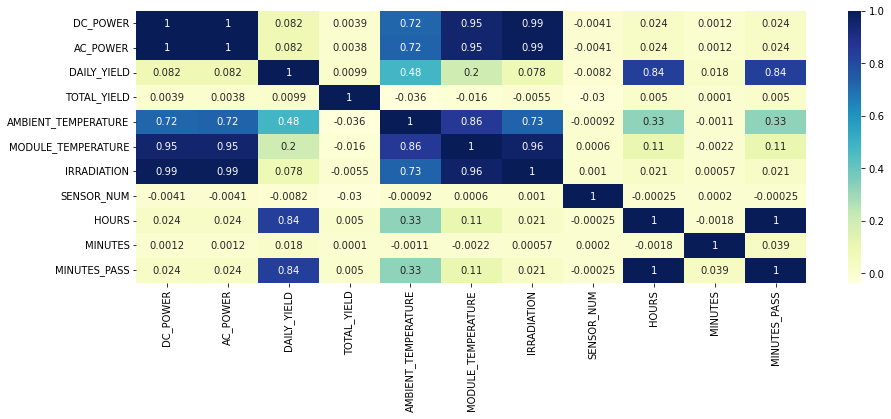

In [43]:
corrMatrix = df_plant1[cols_corr].corr()
plt.figure(figsize=(15,5))
fig_corr = sns.heatmap(corrMatrix,cmap="YlGnBu", annot=True)
plt.show()

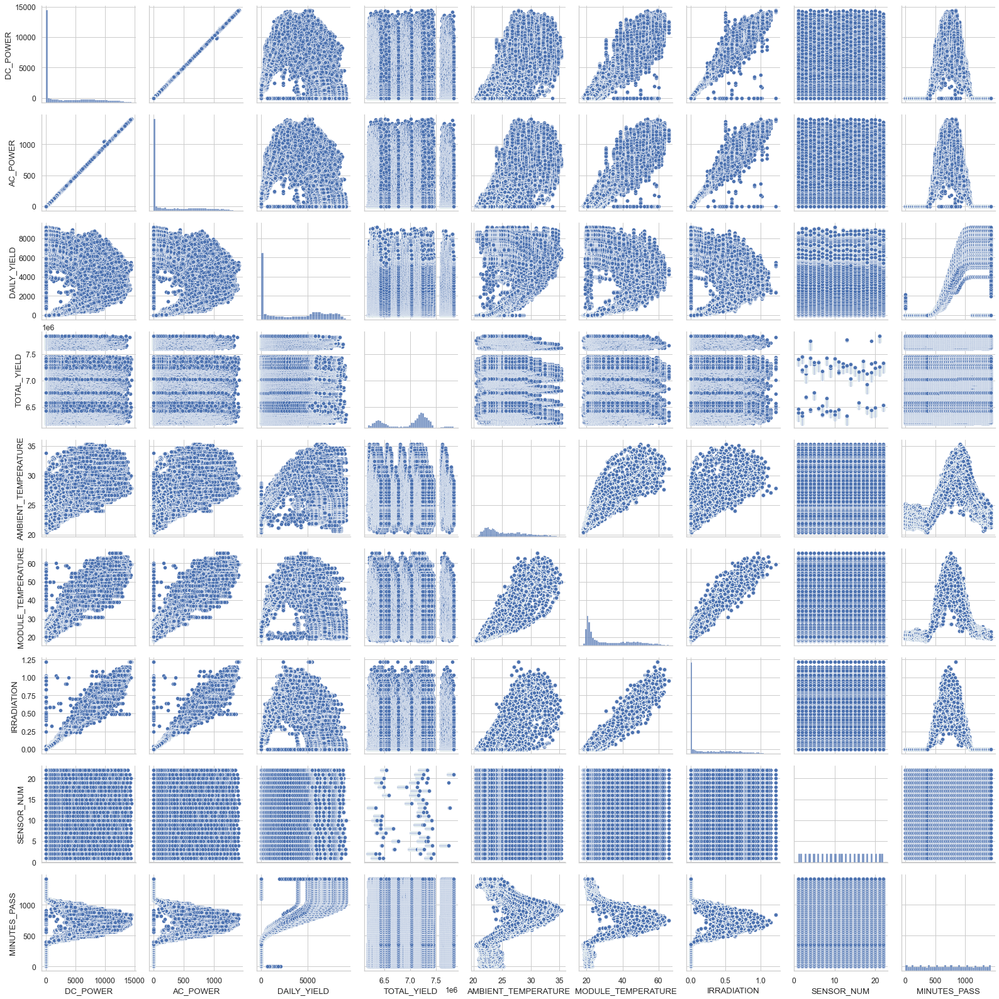

In [44]:
sns.set(style='whitegrid', palette="deep", font_scale=1.1, rc={"figure.figsize": [15, 5]})
cols_pair = ['DC_POWER', 'AC_POWER', 'DAILY_YIELD','TOTAL_YIELD', 'AMBIENT_TEMPERATURE', 
             'MODULE_TEMPERATURE','IRRADIATION', 'SENSOR_NUM', 'MINUTES_PASS']
fig_pair = sns.pairplot(df_plant1[cols_pair])
plt.show()

From last two figures, we can get a lot of insights -
- high correlation between DC Power and AC Power
- high correlation between DC Power and Irradiation
- high correlation between AC Power and Irradiation
- correlation between DC Power, AC Power and Module Temperature
- correlation between DC Power, AC Power and Ambient Temperature
- correlation between Ambient Temperature, Module Temperature and Irradiation
- correlation between Daily Yield and Ambient Temperature

There seems to have outliers in - 
-  DC Power - AC Power (very few)
-  DC Power, AC Power - Module Temperature
-  DC Power, AC Power - Irradiation

From these outliers, we can detect equipment failures and need for maintenance.

- Outliers in DC-AC conversion indicates that there is DC power delivered to inverter but less AC power generated than expected,  the inverter may be malfunctioning. It indicates failure of the inverter.

- Outliers in Power-Irradiation indicates if there is enough sunlight but no or less power is generated, this is the sign of faulty solar panels. It indicates failure of the panel lines(solar modules).

looking at the pairplot of TOTAL_YIELD vs SENSOR_NUM, we can divide the distribution of data into two groups - lower and upper. It means inverters are in two groups, One group has higher total yield than the other one. This is most likely because this group was installed earlier than the other group.

#### Let's take closer look on pairplot of highly correlated features

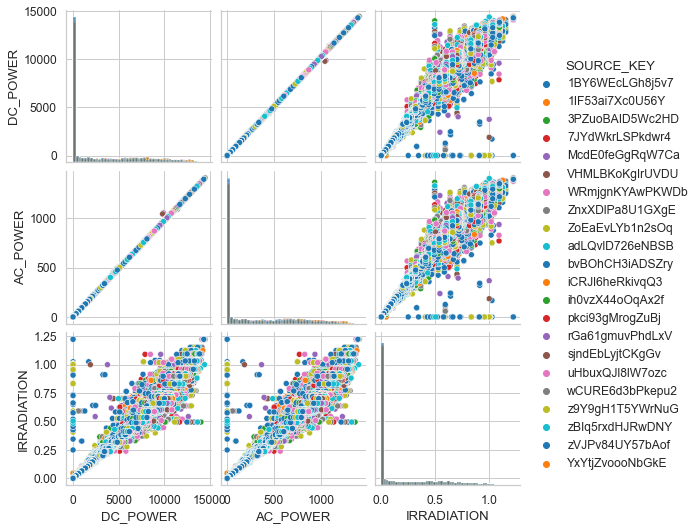

In [45]:
cols = ["DC_POWER", "AC_POWER", "IRRADIATION", "SOURCE_KEY"]
sns.pairplot(df_plant1[cols], hue="SOURCE_KEY", diag_kind="hist", palette="tab10")
plt.show()

It can be seen that most of the outliers are from small group of inverters.

## 3.2 AC Power vs DC Power

This indicates how well our inverter is converting DC power into AC Power. Any outlier in this plot can be used to detect faulty inverters.

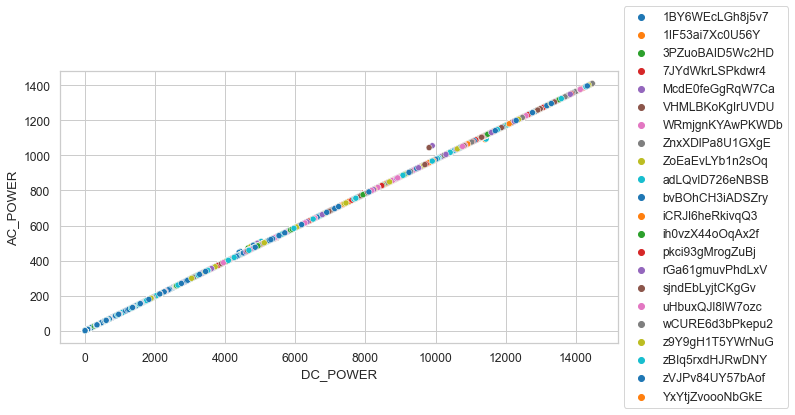

In [46]:
plt.figure(figsize=(10,5))
fig_power = sns.scatterplot(data=df_plant1, x="DC_POWER", y="AC_POWER", hue="SOURCE_KEY", palette="tab10")
fig_power.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
plt.show()

Finding the outliers based on the plot above :-

In [47]:
# a = []
# for i in range(df_plant1.shape[0]):
#     if df_plant1['DC_POWER'][i]<10000 and df_plant1['AC_POWER'][i]>1000:
#         a.append(i)
# a

In [49]:
df_plant1[(df_plant1['DC_POWER'] < 10000) & (df_plant1['AC_POWER']>1000)]

,DATE_TIME,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION,SENSOR_NUM,SENSOR_NAME,DATE,TIME,HOURS,MINUTES,MINUTES_PASS,DATE_STR
14290,2020-05-22 13:00:00,McdE0feGgRqW7Ca,9904.571429,1055.75,4057.0,7213112.0,31.318955,54.85741,0.814844,5,5,2020-05-22,13:00:00,13,0,780,2020-05-22
14302,2020-05-22 13:00:00,sjndEbLyjtCKgGv,9814.285714,1044.90,4280.0,7070166.0,31.318955,54.85741,0.814844,16,16,2020-05-22,13:00:00,13,0,780,2020-05-22


These are the inverters which are having issues in converting DC Power into AC power.

## 3.3 Power vs Temperature

From our pairplots we can clearly see some outliers in the DC&AC Power vs Module Temperature. Other Temperatures do not show any obvious outliers.

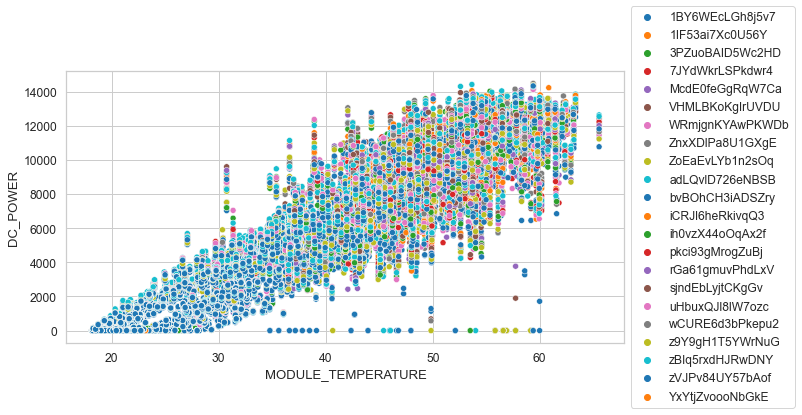

In [50]:
plt.figure(figsize=(10,5))
fig_temp = sns.scatterplot(data=df_plant1, x="MODULE_TEMPERATURE", y="DC_POWER", hue="SOURCE_KEY", palette="tab10")
fig_temp.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
plt.show()

## 3.4 Power vs Irradiation
This indicates how well our photovoltaic panel lines can convert sunlight to DC power. Any outlier in this plot indicates malfunctioning photovoltaic panel lines.

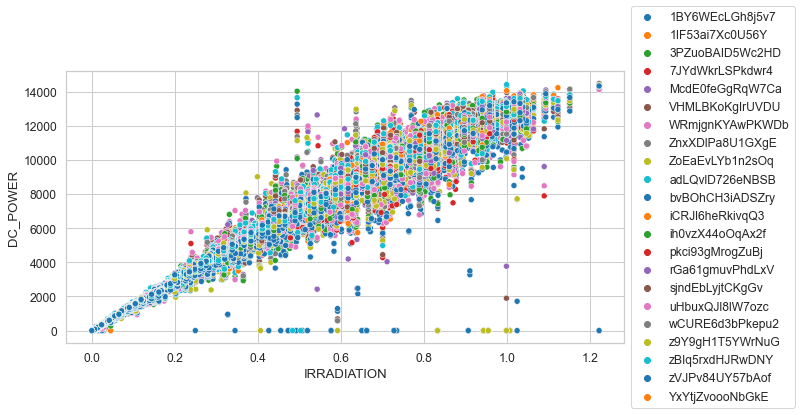

In [51]:
plt.figure(figsize=(10,5))
fig_irr = sns.scatterplot(data=df_plant1, x="IRRADIATION", y="DC_POWER", hue="SOURCE_KEY", palette="tab10")
fig_irr.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
plt.show()

We can see the instances where DC Power is zero for some Irradiation levels, it means some inverters received no DC power even though there was more than enough sunlight to generate power. We clearly have some equipment malfunction here.

Finding the malfunctioning solar modules based on the plot above :-

In [52]:
b = []
for i in range(df_plant1.shape[0]):
    if df_plant1['IRRADIATION'][i]>0.2 and df_plant1['DC_POWER'][i]==0:
        b.append(i)

In [53]:
# df_plant1[(df_plant1['IRRADIATION'] >0.2) & (df_plant1['DC_POWER'] == 0)]

In [54]:
df_plant1.loc[b]

,DATE_TIME,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION,SENSOR_NUM,SENSOR_NAME,DATE,TIME,HOURS,MINUTES,MINUTES_PASS,DATE_STR
815,2020-05-15 09:15:00,zVJPv84UY57bAof,0.0,0.0,711.0,7116862.0,27.988362,46.617706,0.344884,21,21,2020-05-15,09:15:00,9,15,555,2020-05-15
837,2020-05-15 09:30:00,zVJPv84UY57bAof,0.0,0.0,711.0,7116862.0,27.516728,39.136326,0.249248,21,21,2020-05-15,09:30:00,9,30,570,2020-05-15
18490,2020-05-24 15:15:00,zBIq5rxdHJRwDNY,0.0,0.0,6464.0,6410945.0,33.761304,54.006864,0.476600,20,20,2020-05-24,15:15:00,15,15,915,2020-05-24
20103,2020-05-25 10:15:00,ih0vzX44oOqAx2f,0.0,0.0,1795.0,6258289.0,29.217751,53.501414,0.834157,13,13,2020-05-25,10:15:00,10,15,615,2020-05-25
46675,2020-06-07 12:15:00,bvBOhCH3iADSZry,0.0,0.0,3551.0,6476675.0,28.748334,59.987771,1.024229,22,22,2020-06-07,12:15:00,12,15,735,2020-06-07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61591,2020-06-14 13:45:00,bvBOhCH3iADSZry,0.0,0.0,2378.0,6520020.0,27.048904,47.960231,0.906615,22,22,2020-06-14,13:45:00,13,45,825,2020-06-14
61602,2020-06-14 14:00:00,1BY6WEcLGh8j5v7,0.0,0.0,2402.0,6466065.0,27.848916,59.386079,1.221652,18,18,2020-06-14,14:00:00,14,0,840,2020-06-14
61613,2020-06-14 14:00:00,bvBOhCH3iADSZry,0.0,0.0,2378.0,6520020.0,27.848916,59.386079,1.221652,22,22,2020-06-14,14:00:00,14,0,840,2020-06-14
65714,2020-06-16 12:30:00,zBIq5rxdHJRwDNY,0.0,0.0,3480.0,6575313.0,27.964037,45.408554,0.483400,16,16,2020-06-16,12:30:00,12,30,750,2020-06-16


These are the instances in which solar modules produced no DC Power while having received Irradiation.

To find out the duration of the day in which equipment malfunction has occured, we can take a closer look at the daily distribution of the DC Power vs Time and also Irradiation vs Time.

In [55]:
fig = px.scatter(df_plant1, x="TIME", y="DC_POWER", title="DC Power: Daily Distribution",
                 color = "DATE")
fig.update_traces(marker=dict(size=5, opacity=0.7), selector=dict(mode='markers'))
fig.show()

figure shows the occasions in which there were no power generated during daytime i.e. between 6:30 hrs to 17:30 hrs.

Find those instances :-

In [56]:
df_plant1['TIME'][0]

datetime.time(0, 0)

In [57]:
c = []
for i in range(df_plant1.shape[0]):
    if df_plant1['TIME'][i]> datetime.time(6, 30) and df_plant1['TIME'][i]< datetime.time(17, 30) and df_plant1['DC_POWER'][i]==0:
        c.append(i)

Let's check if c is same as b-

In [58]:
c == b

False

In [59]:
print(len(b),len(c))

63 65


In [60]:
for i in c:
    if i not in b:
        print(i)

67267
67268


These two occasions are of the early morning (between 6 am - 6:30 am). Maybe this is because of some bad weather, we need to look at the weather data for more detail.

In [61]:
fig = px.scatter(df_plant1, x="TIME", y="IRRADIATION", title="Irradiation: Daily Distribution", color = "DATE")
fig.update_traces(marker=dict(size=5, opacity=0.7), selector=dict(mode='markers'))
fig.show()

for the time in which there were no power generated, the above figure shows that the irradiation level never dropped low enough during the day to explain this loss of power. This indicates equipment failure.

NOTE: These plot are interactive. To choose any specific day, double click on the day in the legend on the right.

## 3.5 Temperature

In [62]:
df_plant1[['MODULE_TEMPERATURE','AMBIENT_TEMPERATURE']].describe()

,MODULE_TEMPERATURE,AMBIENT_TEMPERATURE
count,68774.000000,68774.000000
mean,31.244997,25.558521
std,12.308283,3.361300
min,18.140415,20.398505
25%,21.123944,22.724491
50%,24.818984,24.670178
75%,41.693659,27.960429
max,65.545714,35.252486


### Plot of Module temperature and Ambient temperature of a single day for the period of 24 hours.

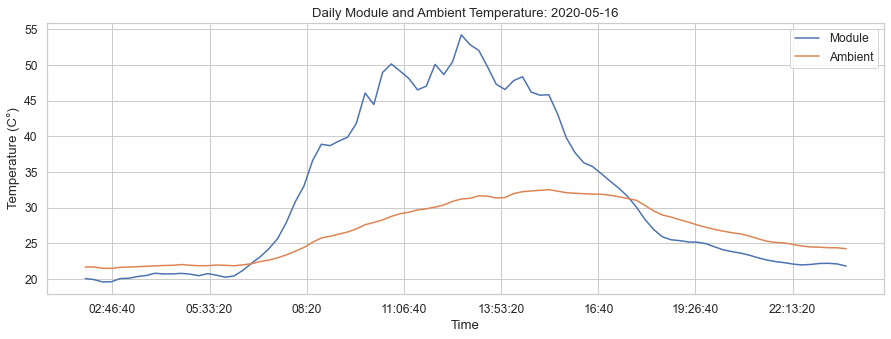

In [63]:
date=["2020-05-16"]
plt.plot(df_plant1[df_plant1["DATE_STR"].isin(date)].TIME, df_plant1[df_plant1["DATE_STR"].isin(date)].MODULE_TEMPERATURE, label="Module")
plt.plot(df_plant1[df_plant1["DATE_STR"].isin(date)].TIME, df_plant1[df_plant1["DATE_STR"].isin(date)].AMBIENT_TEMPERATURE, label="Ambient")
# plt.gcf().axes[0].xaxis.set_major_formatter(xformatter) # set xaxis format
plt.legend()
plt.title("Daily Module and Ambient Temperature: {}" .format(date[0]))
plt.xlabel("Time")
plt.ylabel("Temperature (C°)")
plt.show()

Ambient temperatures range from 20 to 35°C, modules reach temperatures from 18 to 65 °C (65 C is for the whole data, and here we have plotted data of only one date). Modules reach significantly higher temperatures than their ambient air during daytime. Ambient temperature is lagging behind daily module cooldown. This means the modules cool down quicker than their environment.

### Plot of Module temperature and Ambient temperature for whole dataset.

In [64]:
for i in df_plant1.columns.values:
    print(i, "\t - \t", type(df_plant1[i][0]))

DATE_TIME 	 - 	 <class 'str'>
SOURCE_KEY 	 - 	 <class 'str'>
DC_POWER 	 - 	 <class 'numpy.float64'>
AC_POWER 	 - 	 <class 'numpy.float64'>
DAILY_YIELD 	 - 	 <class 'numpy.float64'>
TOTAL_YIELD 	 - 	 <class 'numpy.float64'>
AMBIENT_TEMPERATURE 	 - 	 <class 'numpy.float64'>
MODULE_TEMPERATURE 	 - 	 <class 'numpy.float64'>
IRRADIATION 	 - 	 <class 'numpy.float64'>
SENSOR_NUM 	 - 	 <class 'numpy.int64'>
SENSOR_NAME 	 - 	 <class 'str'>
DATE 	 - 	 <class 'datetime.date'>
TIME 	 - 	 <class 'datetime.time'>
HOURS 	 - 	 <class 'numpy.int64'>
MINUTES 	 - 	 <class 'numpy.int64'>
MINUTES_PASS 	 - 	 <class 'numpy.int64'>
DATE_STR 	 - 	 <class 'str'>


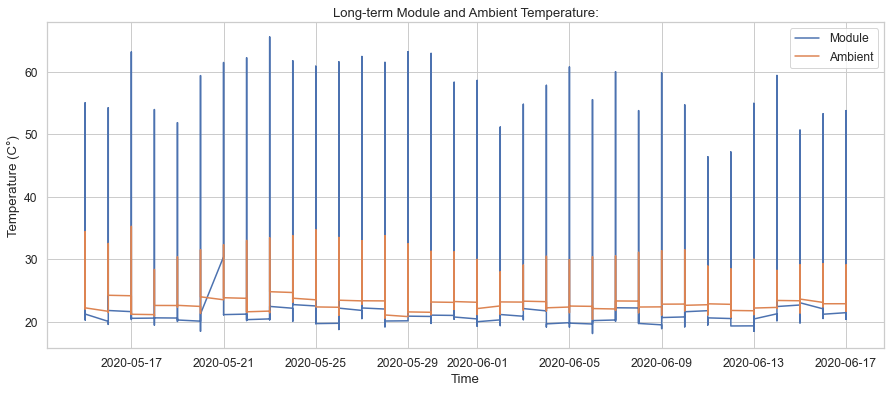

In [65]:
f = plt.figure()
f.set_figwidth(15)
f.set_figheight(6)

plt.plot(df_plant1.DATE, df_plant1.MODULE_TEMPERATURE, label="Module")   
plt.plot(df_plant1.DATE, df_plant1.AMBIENT_TEMPERATURE, label="Ambient")
plt.title("Long-term Module and Ambient Temperature:")
plt.legend()
plt.xlabel("Time")
plt.ylabel("Temperature (C°)")
plt.show()

There are two days with significantly lower temperature ("bad weather") on. Such events may be difficult to forecast without access to more weather data (air pressure, wind, humidity, cloud formation etc.) and advanced weather forecasting models.

### Making a checkpoint

In [66]:
df_plant1.to_csv("data2.csv", index = False)

### Import the last saved data

In [67]:
df_plant1 = pd.read_csv('data2.csv')

In [68]:
df_plant1.head(5)

,DATE_TIME,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION,SENSOR_NUM,SENSOR_NAME,DATE,TIME,HOURS,MINUTES,MINUTES_PASS,DATE_STR
0,2020-05-15 00:00:00,1BY6WEcLGh8j5v7,0.0,0.0,0.0,6259559.0,25.184316,22.857507,0.0,1,1,2020-05-15,00:00:00,0,0,0,2020-05-15
1,2020-05-15 00:00:00,1IF53ai7Xc0U56Y,0.0,0.0,0.0,6183645.0,25.184316,22.857507,0.0,2,2,2020-05-15,00:00:00,0,0,0,2020-05-15
2,2020-05-15 00:00:00,3PZuoBAID5Wc2HD,0.0,0.0,0.0,6987759.0,25.184316,22.857507,0.0,3,3,2020-05-15,00:00:00,0,0,0,2020-05-15
3,2020-05-15 00:00:00,7JYdWkrLSPkdwr4,0.0,0.0,0.0,7602960.0,25.184316,22.857507,0.0,4,4,2020-05-15,00:00:00,0,0,0,2020-05-15
4,2020-05-15 00:00:00,McdE0feGgRqW7Ca,0.0,0.0,0.0,7158964.0,25.184316,22.857507,0.0,5,5,2020-05-15,00:00:00,0,0,0,2020-05-15


<a id="section-four"></a>
# 4. Condition Monitoring

In section 3 we found evidence that points towards equipment failure. Now we are going to build models to detect equipment failure automatically.

## 4.1 Rule-based Fault Detection
During the data exploration we found a simple way to identify faulty equipment: If there is no power measured at the inverter during normal daytime operation, we can assume/identify equipment failure. Let's create a new column ("STATUS") that identifies faulty operation:

We will be looking for the time at which there is fault in the equipment during daytime.

We want the time to be in between sunrise and sunset.
So we will define a range - 
- start (for sunrise) to end (for sunset)

In [69]:
# Function to check if time is during daytime
def time_in_range(start, end, x):
    """Return true if x is in the range [start, end]"""
    if start <= end:
        return start <= x <= end

# set normal daytime operation range
start=datetime.time(6,30,0) # sunrise
end=datetime.time(17,30,0) # sunset

In [70]:
print('start', type(start))
print('end', type(end))
print('df_plant1["TIME"]', type(df_plant1["TIME"][0]))

start <class 'datetime.time'>
end <class 'datetime.time'>
df_plant1["TIME"] <class 'str'>


We will compare start and end variables to TIME feature of the dataframe, since TIME feature is 
of string datatype, therefore we need to convert both (start & end) into string variables.

In [71]:
# convert start and end times into string variables
import datetime
start = start.strftime('%H/%M/%S')
end = end.strftime('%H/%M/%S')

In [72]:
print('start', type(start))
print('end', type(end))
print('df_plant1["TIME"]', type(df_plant1["TIME"][0]))

start <class 'str'>
end <class 'str'>
df_plant1["TIME"] <class 'str'>


We will create a new column to check proper operation, which will return "Normal" if operation is normal and "Fault" if operation is faulty.

Faulty means when the time is daytime, between (6:30 - 17:30 hrs) and Power generation (i.e. DC_POWER) is zero.

In [73]:
df_plant1["STATUS"] = 0
for i in df_plant1.index:            
    if  time_in_range(start, end, df_plant1["TIME"][i]) and df_plant1["DC_POWER"][i] == 0:
        df_plant1["STATUS"][i] = "Fault"
    else:
        df_plant1["STATUS"][i] = "Normal"

In [74]:
df_plant1.STATUS.value_counts()

Normal    68573
Fault       201
Name: STATUS, dtype: int64

In [75]:
fig = px.scatter(df_plant1, x="IRRADIATION", y="DC_POWER", title="Fault Identification", 
                 color="STATUS", labels={"DC_POWER":"DC Power (kW)", "IRRADIATION":"Irradiation"})
fig.update_traces(marker=dict(size=3, opacity=0.7), selector=dict(mode='marker'))
fig.show()

### 4.1.1 Days with faults

#### show the incidents in which there were equipments failure (solar modules failure).

In [76]:
df_plant1[df_plant1["STATUS"] == "Fault"]["DATE"]   

515      2020-05-15
815      2020-05-15
837      2020-05-15
4416     2020-05-17
4417     2020-05-17
            ...    
67253    2020-06-17
67254    2020-06-17
67255    2020-06-17
67267    2020-06-17
67268    2020-06-17
Name: DATE, Length: 201, dtype: object

Total 201 incidents of equipment failure.

In [77]:
df_plant1[df_plant1["STATUS"] == "Fault"]["DATE"].value_counts()

2020-06-07    33
2020-06-14    24
2020-05-19    22
2020-06-11    22
2020-06-12    22
2020-05-17    20
2020-06-17    19
2020-06-16    18
2020-05-25    11
2020-05-15     3
2020-05-24     2
2020-05-26     2
2020-05-20     1
2020-06-05     1
2020-06-09     1
Name: DATE, dtype: int64

In [78]:
print("Date {} and {} has the most number of equipment failures i.e. {} and {} respectively.".format(
df_plant1[df_plant1["STATUS"] == "Fault"]["DATE"].value_counts().index[0], 
    df_plant1[df_plant1["STATUS"] == "Fault"]["DATE"].value_counts().index[1],
df_plant1[df_plant1["STATUS"] == "Fault"]["DATE"].value_counts()[0],
df_plant1[df_plant1["STATUS"] == "Fault"]["DATE"].value_counts()[1]))

Date 2020-06-07 and 2020-06-14 has the most number of equipment failures i.e. 33 and 24 respectively.


In [79]:
fig=px.bar(df_plant1[df_plant1["STATUS"]== "Fault"]["DATE"].value_counts(),
           title="Fault Events Detection: Rule-based", labels={"value":"Faults", "index":"Date","SENSOR_NAME":"Inverter"})
fig.update(layout_showlegend=False)

#### detect the inverter which has most number of faults.

In [80]:
df_plant1[df_plant1["STATUS"]== "Fault"][["SOURCE_KEY", "SENSOR_NAME"]]

,SOURCE_KEY,SENSOR_NAME
515,VHMLBKoKgIrUVDU,6
815,zVJPv84UY57bAof,21
837,zVJPv84UY57bAof,21
4416,1BY6WEcLGh8j5v7,1
4417,1IF53ai7Xc0U56Y,2
...,...,...
67253,z9Y9gH1T5YWrNuG,15
67254,zBIq5rxdHJRwDNY,16
67255,zVJPv84UY57bAof,17
67267,bvBOhCH3iADSZry,22


In [81]:
df_plant1[df_plant1["STATUS"]== "Fault"]["SOURCE_KEY"].value_counts()

bvBOhCH3iADSZry    27
1BY6WEcLGh8j5v7    25
z9Y9gH1T5YWrNuG    13
zBIq5rxdHJRwDNY    10
wCURE6d3bPkepu2     9
uHbuxQJl8lW7ozc     9
sjndEbLyjtCKgGv     9
VHMLBKoKgIrUVDU     8
zVJPv84UY57bAof     8
iCRJl6heRkivqQ3     8
pkci93gMrogZuBj     7
WRmjgnKYAwPKWDb     7
McdE0feGgRqW7Ca     7
7JYdWkrLSPkdwr4     7
3PZuoBAID5Wc2HD     7
ZnxXDlPa8U1GXgE     7
ZoEaEvLYb1n2sOq     6
YxYtjZvoooNbGkE     6
rGa61gmuvPhdLxV     6
1IF53ai7Xc0U56Y     6
ih0vzX44oOqAx2f     5
adLQvlD726eNBSB     4
Name: SOURCE_KEY, dtype: int64

In [82]:
fig=px.bar(df_plant1[df_plant1["STATUS"] == "Fault"]["SOURCE_KEY"].value_counts(), 
           title="Inverter Faults: Rule-based",
           labels={"value":"Faults", "index":"Inverter", "SENSOR_NAME":"Inverter"})
fig.update(layout_showlegend=False)

In [83]:
df_plant1[df_plant1["STATUS"] == "Fault"]["DATE"].value_counts()

2020-06-07    33
2020-06-14    24
2020-05-19    22
2020-06-11    22
2020-06-12    22
2020-05-17    20
2020-06-17    19
2020-06-16    18
2020-05-25    11
2020-05-15     3
2020-05-24     2
2020-05-26     2
2020-05-20     1
2020-06-05     1
2020-06-09     1
Name: DATE, dtype: int64

In [84]:
print("The most faults were recorded on {} and {}." .format(df_plant1[df_plant1["STATUS"]== "Fault"]["DATE"].value_counts().index[0], df_plant1[df_plant1["STATUS"]== "Fault"]["DATE"].value_counts().index[1]))
print("Inverter {} and {} had the most failures." .format(df_plant1[df_plant1["STATUS"]== "Fault"]["SOURCE_KEY"].value_counts().index[0],df_plant1[df_plant1["STATUS"]== "Fault"]["SOURCE_KEY"].value_counts().index[1]))

The most faults were recorded on 2020-06-07 and 2020-06-14.
Inverter bvBOhCH3iADSZry and 1BY6WEcLGh8j5v7 had the most failures.


### 4.1.2 Number of recorded faults

In [85]:
df_plant1.STATUS.value_counts()

Normal    68573
Fault       201
Name: STATUS, dtype: int64

In [86]:
print("There are {} records of faulty operation!" .format(df_plant1.STATUS.value_counts().Fault))

There are 201 records of faulty operation!


## Feature selcection

The dependent feature is DC_POWER, which is highly related with IRRADIATION because IRRADIATION is making the solar modules to generate DC_POWER, therefore we will only take IRRADIATION to make prediction.

In [87]:
df_plant1.head(5)

,DATE_TIME,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION,SENSOR_NUM,SENSOR_NAME,DATE,TIME,HOURS,MINUTES,MINUTES_PASS,DATE_STR,STATUS
0,2020-05-15 00:00:00,1BY6WEcLGh8j5v7,0.0,0.0,0.0,6259559.0,25.184316,22.857507,0.0,1,1,2020-05-15,00:00:00,0,0,0,2020-05-15,Normal
1,2020-05-15 00:00:00,1IF53ai7Xc0U56Y,0.0,0.0,0.0,6183645.0,25.184316,22.857507,0.0,2,2,2020-05-15,00:00:00,0,0,0,2020-05-15,Normal
2,2020-05-15 00:00:00,3PZuoBAID5Wc2HD,0.0,0.0,0.0,6987759.0,25.184316,22.857507,0.0,3,3,2020-05-15,00:00:00,0,0,0,2020-05-15,Normal
3,2020-05-15 00:00:00,7JYdWkrLSPkdwr4,0.0,0.0,0.0,7602960.0,25.184316,22.857507,0.0,4,4,2020-05-15,00:00:00,0,0,0,2020-05-15,Normal
4,2020-05-15 00:00:00,McdE0feGgRqW7Ca,0.0,0.0,0.0,7158964.0,25.184316,22.857507,0.0,5,5,2020-05-15,00:00:00,0,0,0,2020-05-15,Normal


In [88]:
df_plant1.IRRADIATION.describe()

count    68774.000000
mean         0.232305
std          0.301948
min          0.000000
25%          0.000000
50%          0.031620
75%          0.454880
max          1.221652
Name: IRRADIATION, dtype: float64

<AxesSubplot:xlabel='IRRADIATION'>

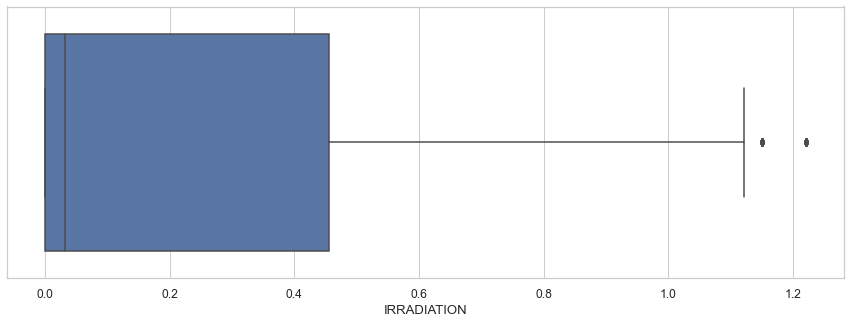

In [89]:
sns.boxplot(df_plant1.IRRADIATION)

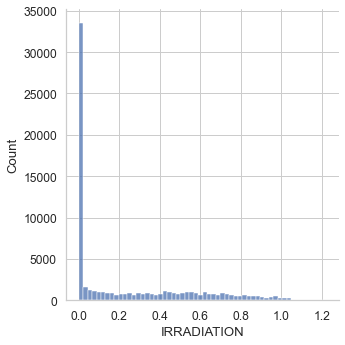

In [90]:
sns.displot(df_plant1.IRRADIATION)

In [91]:
df_plant1.IRRADIATION.value_counts()

0.000000    30398
0.086953       22
0.107214       22
0.056334       22
0.028989       22
            ...  
0.002115       10
0.008883       10
0.014272       10
0.000028       10
0.000065       10
Name: IRRADIATION, Length: 1755, dtype: int64

In [92]:
(df_plant1.IRRADIATION.value_counts()[0]/df_plant1.IRRADIATION.shape[0])*100

44.19984296391078

In [93]:
print(f" {round((df_plant1.IRRADIATION.value_counts()[0]/df_plant1.IRRADIATION.shape[0])*100,1)} percent \
of the data has IRRADIATION level less than 0." )

 44.2 percent of the data has IRRADIATION level less than 0.


In [94]:
df_plant1.IRRADIATION.value_counts().index.sort_values(ascending = True)[0:30]

Float64Index([                   0.0, 1.4736836000000004e-05,
              1.5969891733333336e-05, 2.0070272266666667e-05,
               2.499842000000001e-05, 2.7608272399999994e-05,
              3.9083115333333336e-05,         4.49041162e-05,
              4.9854124400000006e-05,  5.161001586666666e-05,
               5.614888285714287e-05,  6.189576866666667e-05,
                       6.4555534e-05,         7.79209073e-05,
               8.352672366666667e-05,         9.44485646e-05,
                9.92009574285714e-05,         0.000100219904,
                  0.0001221914806666,     0.0001250367553333,
                       0.00012538276,         0.000129449935,
                      0.000143387096,        0.0001461652226,
                     0.0001471694642,     0.0001515382176666,
                  0.0001651499813333,     0.0001658766313333,
                      0.000166865986,     0.0001930037933333],
             dtype='float64')

### Outlier detection

Here we will use upper and lower fence limit to detect the outliers.

In [95]:
Q1 = df_plant1.IRRADIATION.quantile(0.25)
Q3 = df_plant1.IRRADIATION.quantile(0.75)
Q1, Q3

(0.0, 0.4548798128571428)

In [96]:
IQR = Q3 - Q1
IQR

0.4548798128571428

In [97]:
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
lower_limit, upper_limit

(-0.6823197192857142, 1.137199532142857)

### Data above upper limit

In [98]:
out = df_plant1.IRRADIATION[df_plant1.IRRADIATION > upper_limit]
out

29950    1.151102
29951    1.151102
29952    1.151102
29953    1.151102
29954    1.151102
29955    1.151102
29956    1.151102
29957    1.151102
29958    1.151102
29959    1.151102
29960    1.151102
29961    1.151102
29962    1.151102
29963    1.151102
29964    1.151102
29965    1.151102
29966    1.151102
29967    1.151102
29968    1.151102
29969    1.151102
29970    1.151102
29971    1.151102
61602    1.221652
61603    1.221652
61604    1.221652
61605    1.221652
61606    1.221652
61607    1.221652
61608    1.221652
61609    1.221652
61610    1.221652
61611    1.221652
61612    1.221652
61613    1.221652
61614    1.221652
61615    1.221652
61616    1.221652
61617    1.221652
61618    1.221652
61619    1.221652
61620    1.221652
61621    1.221652
61622    1.221652
61623    1.221652
Name: IRRADIATION, dtype: float64

In [99]:
print(f"Out of {len(df_plant1)} observations, {len(df_plant1[df_plant1.IRRADIATION > upper_limit])} observations are above upper fence, these are outliers and must be removed.")

Out of 68774 observations, 44 observations are above upper fence, these are outliers and must be removed.


### Dataframe excluding outliers -

In [100]:
df = df_plant1[~df_plant1.IRRADIATION.isin(out)]

In [101]:
print(
len(df), len(df_plant1))

68730 68774


In [102]:
df = df.reset_index(drop = True)

In [103]:
df.head(3)

,DATE_TIME,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION,SENSOR_NUM,SENSOR_NAME,DATE,TIME,HOURS,MINUTES,MINUTES_PASS,DATE_STR,STATUS
0,2020-05-15 00:00:00,1BY6WEcLGh8j5v7,0.0,0.0,0.0,6259559.0,25.184316,22.857507,0.0,1,1,2020-05-15,00:00:00,0,0,0,2020-05-15,Normal
1,2020-05-15 00:00:00,1IF53ai7Xc0U56Y,0.0,0.0,0.0,6183645.0,25.184316,22.857507,0.0,2,2,2020-05-15,00:00:00,0,0,0,2020-05-15,Normal
2,2020-05-15 00:00:00,3PZuoBAID5Wc2HD,0.0,0.0,0.0,6987759.0,25.184316,22.857507,0.0,3,3,2020-05-15,00:00:00,0,0,0,2020-05-15,Normal


making checkpoint 

In [104]:
df.to_csv('data3.csv', index=False)

import the saved data

In [105]:
df = pd.read_csv('data3.csv')

In [106]:
df.head(5)

,DATE_TIME,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION,SENSOR_NUM,SENSOR_NAME,DATE,TIME,HOURS,MINUTES,MINUTES_PASS,DATE_STR,STATUS
0,2020-05-15 00:00:00,1BY6WEcLGh8j5v7,0.0,0.0,0.0,6259559.0,25.184316,22.857507,0.0,1,1,2020-05-15,00:00:00,0,0,0,2020-05-15,Normal
1,2020-05-15 00:00:00,1IF53ai7Xc0U56Y,0.0,0.0,0.0,6183645.0,25.184316,22.857507,0.0,2,2,2020-05-15,00:00:00,0,0,0,2020-05-15,Normal
2,2020-05-15 00:00:00,3PZuoBAID5Wc2HD,0.0,0.0,0.0,6987759.0,25.184316,22.857507,0.0,3,3,2020-05-15,00:00:00,0,0,0,2020-05-15,Normal
3,2020-05-15 00:00:00,7JYdWkrLSPkdwr4,0.0,0.0,0.0,7602960.0,25.184316,22.857507,0.0,4,4,2020-05-15,00:00:00,0,0,0,2020-05-15,Normal
4,2020-05-15 00:00:00,McdE0feGgRqW7Ca,0.0,0.0,0.0,7158964.0,25.184316,22.857507,0.0,5,5,2020-05-15,00:00:00,0,0,0,2020-05-15,Normal


## 4.2 Fault Detection with Regression Models

### 4.2.1 Linear Model

At first attempt we will try to predicting DC power from irradiation by assuming a linear relationship and will build a linear model.

Note: PV module panels can reach up to 65°C. The efficiency of PV cells is usually lower at high temperatures. This leads to a non-linear relationship between irradiance and generated DC power. 
We will consider this nonlinearity later in the project.

In [107]:
from sklearn.linear_model import LinearRegression

# Model
reg = LinearRegression()

# choose training data
train_dates = ["2020-05-16", "2020-05-17","2020-05-18" ,"2020-05-19", "2020-05-20", "2020-05-21"]
df_train = df[df["DATE_STR"].isin(train_dates)]

#fit the training data
reg.fit(df_train[["IRRADIATION"]], df_train.DC_POWER)

LinearRegression()

In [108]:
df_test = df[~df["DATE_STR"].isin(train_dates)]

In [109]:
print(df_train.shape)
print(df_test.shape)

(11188, 18)
(57542, 18)


- Make predictions 
- Calculate residuals, i.e. the difference between actual value and predicted value

In [110]:
df_test["Prediction_lr"] = reg.predict(df_test[["IRRADIATION"]])
df_test["Residual_lr"] = df_test["Prediction_lr"] - df_test["DC_POWER"]
df_test["Residual_abs_lr"] = df_test["Residual_lr"].abs()

In [111]:
df_test.head(4)

,DATE_TIME,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION,SENSOR_NUM,...,DATE,TIME,HOURS,MINUTES,MINUTES_PASS,DATE_STR,STATUS,Prediction_lr,Residual_lr,Residual_abs_lr
0,2020-05-15 00:00:00,1BY6WEcLGh8j5v7,0.0,0.0,0.0,6259559.0,25.184316,22.857507,0.0,1,...,2020-05-15,00:00:00,0,0,0,2020-05-15,Normal,57.250005,57.250005,57.250005
1,2020-05-15 00:00:00,1IF53ai7Xc0U56Y,0.0,0.0,0.0,6183645.0,25.184316,22.857507,0.0,2,...,2020-05-15,00:00:00,0,0,0,2020-05-15,Normal,57.250005,57.250005,57.250005
2,2020-05-15 00:00:00,3PZuoBAID5Wc2HD,0.0,0.0,0.0,6987759.0,25.184316,22.857507,0.0,3,...,2020-05-15,00:00:00,0,0,0,2020-05-15,Normal,57.250005,57.250005,57.250005
3,2020-05-15 00:00:00,7JYdWkrLSPkdwr4,0.0,0.0,0.0,7602960.0,25.184316,22.857507,0.0,4,...,2020-05-15,00:00:00,0,0,0,2020-05-15,Normal,57.250005,57.250005,57.250005


In [112]:
df_test.columns.values

array(['DATE_TIME', 'SOURCE_KEY', 'DC_POWER', 'AC_POWER', 'DAILY_YIELD',
       'TOTAL_YIELD', 'AMBIENT_TEMPERATURE', 'MODULE_TEMPERATURE',
       'IRRADIATION', 'SENSOR_NUM', 'SENSOR_NAME', 'DATE', 'TIME',
       'HOURS', 'MINUTES', 'MINUTES_PASS', 'DATE_STR', 'STATUS',
       'Prediction_lr', 'Residual_lr', 'Residual_abs_lr'], dtype=object)

Let's rearrange the columns a bit.

In [113]:
cols = ['DATE_TIME', 'SOURCE_KEY', 'AC_POWER', 'DAILY_YIELD',
       'TOTAL_YIELD', 'AMBIENT_TEMPERATURE', 'MODULE_TEMPERATURE',
        'SENSOR_NUM', 'SENSOR_NAME', 'DATE', 'TIME',
       'HOURS', 'MINUTES', 'MINUTES_PASS', 'DATE_STR', 'STATUS','IRRADIATION', 'DC_POWER',
       'Prediction_lr', 'Residual_lr', 'Residual_abs_lr']

In [114]:
df_test[cols][:5]

,DATE_TIME,SOURCE_KEY,AC_POWER,DAILY_YIELD,TOTAL_YIELD,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,SENSOR_NUM,SENSOR_NAME,DATE,...,HOURS,MINUTES,MINUTES_PASS,DATE_STR,STATUS,IRRADIATION,DC_POWER,Prediction_lr,Residual_lr,Residual_abs_lr
0,2020-05-15 00:00:00,1BY6WEcLGh8j5v7,0.0,0.0,6259559.0,25.184316,22.857507,1,1,2020-05-15,...,0,0,0,2020-05-15,Normal,0.0,0.0,57.250005,57.250005,57.250005
1,2020-05-15 00:00:00,1IF53ai7Xc0U56Y,0.0,0.0,6183645.0,25.184316,22.857507,2,2,2020-05-15,...,0,0,0,2020-05-15,Normal,0.0,0.0,57.250005,57.250005,57.250005
2,2020-05-15 00:00:00,3PZuoBAID5Wc2HD,0.0,0.0,6987759.0,25.184316,22.857507,3,3,2020-05-15,...,0,0,0,2020-05-15,Normal,0.0,0.0,57.250005,57.250005,57.250005
3,2020-05-15 00:00:00,7JYdWkrLSPkdwr4,0.0,0.0,7602960.0,25.184316,22.857507,4,4,2020-05-15,...,0,0,0,2020-05-15,Normal,0.0,0.0,57.250005,57.250005,57.250005
4,2020-05-15 00:00:00,McdE0feGgRqW7Ca,0.0,0.0,7158964.0,25.184316,22.857507,5,5,2020-05-15,...,0,0,0,2020-05-15,Normal,0.0,0.0,57.250005,57.250005,57.250005


## Visualization between Predictions and Actual values

<AxesSubplot:xlabel='IRRADIATION', ylabel='DC_POWER'>

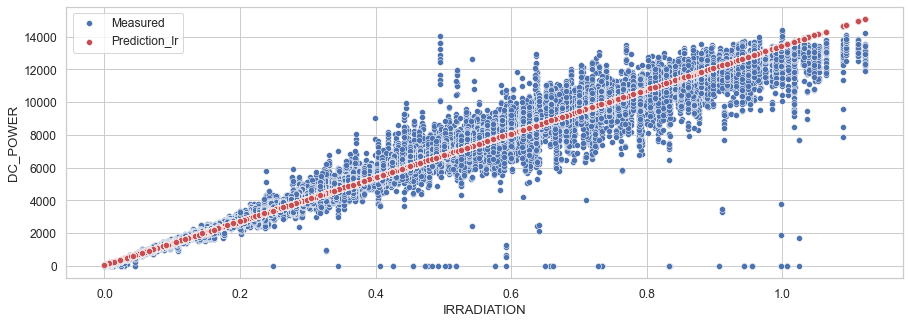

In [115]:
# visualize between input vs target values
sns.scatterplot(df_test.IRRADIATION, df_test.DC_POWER, label="Measured")

# visualize between input vs predicted values
sns.scatterplot(df_test.IRRADIATION, df_test.Prediction_lr, color="r", label="Prediction_lr")

Taking log values of features and predictions for better visualization of the graph.

In [116]:
log_Prediction_lr = np.log(df_test.Prediction_lr)
irradiation = df_test.IRRADIATION
log_DC_POWER = np.log(df_test.DC_POWER)

In [117]:
len(df_test)

57542

<AxesSubplot:xlabel='IRRADIATION', ylabel='DC_POWER'>

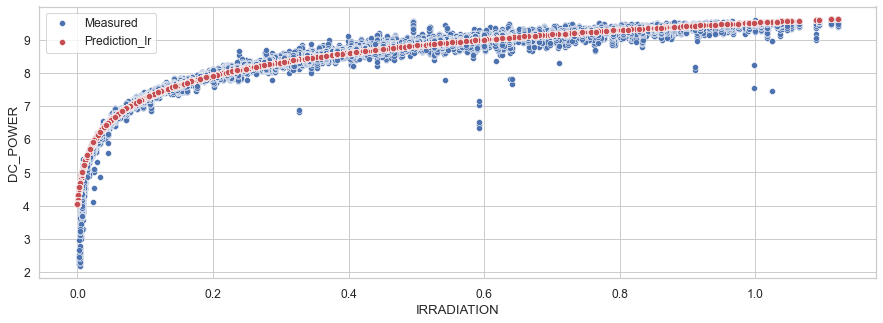

In [118]:
sns.scatterplot(irradiation, log_DC_POWER, label="Measured")
sns.scatterplot(irradiation, log_Prediction_lr, color="r", label="Prediction_lr")

<AxesSubplot:xlabel='DC_POWER', ylabel='Prediction_lr'>

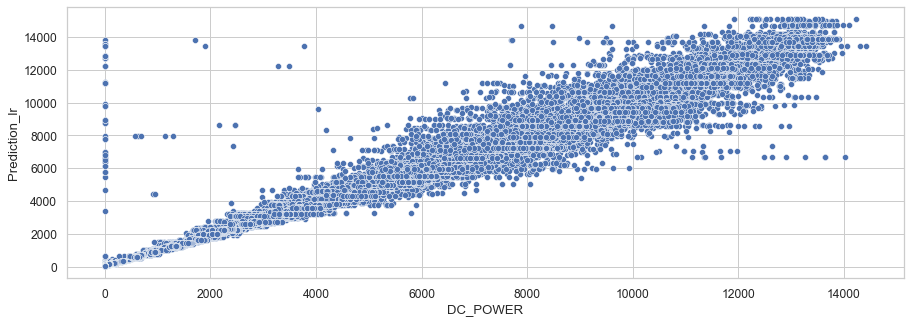

In [119]:
sns.scatterplot(data = df_test, x = "DC_POWER", y = "Prediction_lr" )
# Visualization between target values and predicted values

Here we can see tha linear model has predicted values for the incidents where actual value of DC_POWER is zero.

### Calculating the R-squared

In [120]:
inp = np.array(df_test['IRRADIATION'])
targ = np.array(df_test['DC_POWER'])

In [121]:
inp = inp.reshape(-1,1)
targ = targ.reshape(-1,1)

In [122]:
reg.score(inp,targ)

0.9774532910566022

In [123]:
print(f"Here we can see that the accuracy of the Linear Model is {round(reg.score(inp,targ)*100,2)}% .")

Here we can see that the accuracy of the Linear Model is 97.75% .


## Find the inverter which has highest residual

In [124]:
df_test['Residual_abs_lr'].max()

13776.682753527659

In [125]:
df_test[df_test['Residual_abs_lr'] == df_test['Residual_abs_lr'].max()]

,DATE_TIME,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION,SENSOR_NUM,...,DATE,TIME,HOURS,MINUTES,MINUTES_PASS,DATE_STR,STATUS,Prediction_lr,Residual_lr,Residual_abs_lr
46653,2020-06-07 12:15:00,bvBOhCH3iADSZry,0.0,0.0,3551.0,6476675.0,28.748334,59.987771,1.024229,22,...,2020-06-07,12:15:00,12,15,735,2020-06-07,Fault,13776.682754,13776.682754,13776.682754


In [126]:
df_test[df_test['Residual_abs_lr'] == df_test['Residual_abs_lr'].max()]['SENSOR_NAME']

46653    22
Name: SENSOR_NAME, dtype: int64

## Find the inverter which has maximum number of residuals

In [127]:
df_test['Residual_abs_lr'].mean()

264.5250534449446

In [128]:
df_test[df_test['Residual_abs_lr'] > df_test['Residual_abs_lr'].mean()]

,DATE_TIME,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION,SENSOR_NUM,...,DATE,TIME,HOURS,MINUTES,MINUTES_PASS,DATE_STR,STATUS,Prediction_lr,Residual_lr,Residual_abs_lr
536,2020-05-15 06:15:00,VHMLBKoKgIrUVDU,61.125000,5.912500,0.000000,7206408.000,24.011635,22.353459,0.022282,6,...,2020-05-15,06:15:00,6,15,375,2020-05-15,Normal,355.709614,294.584614,294.584614
617,2020-05-15 07:00:00,zVJPv84UY57bAof,1661.500000,162.675000,70.000000,7116221.000,24.537398,27.185653,0.141940,21,...,2020-05-15,07:00:00,7,0,420,2020-05-15,Normal,1958.526171,297.026171,297.026171
618,2020-05-15 07:15:00,1BY6WEcLGh8j5v7,1856.375000,181.937500,116.250000,6259675.250,24.815960,28.888478,0.154713,1,...,2020-05-15,07:15:00,7,15,435,2020-05-15,Normal,2129.608778,273.233778,273.233778
639,2020-05-15 07:15:00,zVJPv84UY57bAof,1814.857143,177.885714,112.714286,7116263.714,24.815960,28.888478,0.154713,21,...,2020-05-15,07:15:00,7,15,435,2020-05-15,Normal,2129.608778,314.751635,314.751635
661,2020-05-15 07:30:00,zVJPv84UY57bAof,1740.125000,170.537500,157.000000,7116308.000,24.988790,29.605644,0.148799,21,...,2020-05-15,07:30:00,7,30,450,2020-05-15,Normal,2050.397815,310.272815,310.272815
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68064,2020-06-17 16:15:00,sjndEbLyjtCKgGv,3512.875000,345.025000,5619.625000,7261413.625,24.112787,28.996932,0.235078,12,...,2020-06-17,16:15:00,16,15,975,2020-06-17,Normal,3206.087276,-306.787724,306.787724
68065,2020-06-17 16:15:00,uHbuxQJl8lW7ozc,3502.375000,343.950000,5697.375000,7286732.375,24.112787,28.996932,0.235078,13,...,2020-06-17,16:15:00,16,15,975,2020-06-17,Normal,3206.087276,-296.287724,296.287724
68066,2020-06-17 16:15:00,wCURE6d3bPkepu2,3493.250000,343.175000,5612.875000,7028330.875,24.112787,28.996932,0.235078,14,...,2020-06-17,16:15:00,16,15,975,2020-06-17,Normal,3206.087276,-287.162724,287.162724
68068,2020-06-17 16:15:00,zBIq5rxdHJRwDNY,3503.571429,344.085714,5558.142857,6583110.143,24.112787,28.996932,0.235078,16,...,2020-06-17,16:15:00,16,15,975,2020-06-17,Normal,3206.087276,-297.484153,297.484153


In [129]:
df_test[df_test['Residual_abs_lr'] > df_test['Residual_abs_lr'].mean()]['SENSOR_NAME'].sort_values(ascending = False)

49139    22
50415    22
50481    22
32003    22
28049    22
         ..
26392     1
65764     1
59186     1
56920     1
61320     1
Name: SENSOR_NAME, Length: 15340, dtype: int64

In [130]:
df_test[df_test['Residual_abs_lr'] > df_test['Residual_abs_lr'].mean()]['SENSOR_NAME'].value_counts()

1     809
11    781
7     741
13    728
15    725
8     719
19    718
20    717
10    717
3     716
17    714
14    713
5     703
2     692
16    674
12    673
21    664
6     646
18    643
4     637
9     609
22    601
Name: SENSOR_NAME, dtype: int64

As we can see, SENSOR_NAME 1 has the highest number of incidences in which the 'absolute Residuals' are higher than "Mean absolute Residual".

# K Nearest Neighbor Regression

In [131]:
from sklearn import neighbors

In [132]:
knn = neighbors.KNeighborsRegressor(n_neighbors = 5, weights='uniform')

In [133]:
knn.fit(df_train[["IRRADIATION"]], df_train.DC_POWER)

KNeighborsRegressor()

In [134]:
df_test["Prediction_knn"] = knn.predict(df_test[["IRRADIATION"]])
df_test["Residual_knn"] = df_test["Prediction_knn"] - df_test["DC_POWER"]
df_test["Residual_abs_knn"] = df_test["Residual_knn"].abs()

In [135]:
df_test.describe()

,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION,SENSOR_NUM,SENSOR_NAME,HOURS,MINUTES,MINUTES_PASS,Prediction_lr,Residual_lr,Residual_abs_lr,Prediction_knn,Residual_knn,Residual_abs_knn
count,57542.000000,57542.000000,57542.000000,5.754200e+04,57542.000000,57542.000000,57542.000000,57542.000000,57542.000000,57542.000000,57542.00000,57542.000000,57542.000000,57542.000000,57542.000000,57542.000000,57542.000000,57542.000000
mean,3143.548221,307.422792,3279.882812,6.997891e+06,25.498524,31.191851,0.232200,11.478833,11.478833,11.501964,22.49609,712.613917,3167.542201,23.993980,264.525053,3155.186651,11.638430,250.799235
std,4031.734579,393.930007,3155.315423,4.151203e+05,3.316128,12.260387,0.301677,6.342618,6.342618,6.880102,16.76809,413.112999,4040.925334,604.911903,544.535960,4024.338578,615.877323,562.617972
min,0.000000,0.000000,0.000000,6.183645e+06,20.398505,18.140415,0.000000,1.000000,1.000000,0.000000,0.00000,0.000000,57.250005,-7338.030148,0.002823,0.000000,-7007.421429,0.000000
25%,0.000000,0.000000,0.000000,6.518398e+06,22.691970,21.143542,0.000000,6.000000,6.000000,6.000000,15.00000,360.000000,57.250005,-62.942725,57.250005,0.000000,-18.223214,0.000000
50%,436.857143,42.228571,2596.187500,7.171001e+06,24.568143,24.818984,0.033120,11.000000,11.000000,12.000000,15.00000,720.000000,500.883416,57.250005,57.250005,450.228571,0.000000,16.025000
75%,6327.071428,619.825000,6255.000000,7.289679e+06,27.891768,41.449481,0.454355,17.000000,17.000000,17.000000,30.00000,1065.000000,6143.281622,57.250005,294.540348,6542.553572,12.441964,302.473214
max,14413.428570,1405.300000,9163.000000,7.846821e+06,34.705670,65.545714,1.122550,22.000000,22.000000,23.000000,45.00000,1425.000000,15093.681009,13776.682754,13776.682754,13108.775000,12879.532144,12879.532144


In [136]:
df_test.columns.values

array(['DATE_TIME', 'SOURCE_KEY', 'DC_POWER', 'AC_POWER', 'DAILY_YIELD',
       'TOTAL_YIELD', 'AMBIENT_TEMPERATURE', 'MODULE_TEMPERATURE',
       'IRRADIATION', 'SENSOR_NUM', 'SENSOR_NAME', 'DATE', 'TIME',
       'HOURS', 'MINUTES', 'MINUTES_PASS', 'DATE_STR', 'STATUS',
       'Prediction_lr', 'Residual_lr', 'Residual_abs_lr',
       'Prediction_knn', 'Residual_knn', 'Residual_abs_knn'], dtype=object)

In [137]:
comp = df_test[['IRRADIATION','DC_POWER','Prediction_lr','Prediction_knn','Residual_lr','Residual_knn', 'Residual_abs_lr', 'Residual_abs_knn']]

In [138]:
comp.describe()

,IRRADIATION,DC_POWER,Prediction_lr,Prediction_knn,Residual_lr,Residual_knn,Residual_abs_lr,Residual_abs_knn
count,57542.000000,57542.000000,57542.000000,57542.000000,57542.000000,57542.000000,57542.000000,57542.000000
mean,0.232200,3143.548221,3167.542201,3155.186651,23.993980,11.638430,264.525053,250.799235
std,0.301677,4031.734579,4040.925334,4024.338578,604.911903,615.877323,544.535960,562.617972
min,0.000000,0.000000,57.250005,0.000000,-7338.030148,-7007.421429,0.002823,0.000000
25%,0.000000,0.000000,57.250005,0.000000,-62.942725,-18.223214,57.250005,0.000000
50%,0.033120,436.857143,500.883416,450.228571,57.250005,0.000000,57.250005,16.025000
75%,0.454355,6327.071428,6143.281622,6542.553572,57.250005,12.441964,294.540348,302.473214
max,1.122550,14413.428570,15093.681009,13108.775000,13776.682754,12879.532144,13776.682754,12879.532144


From the table above, we can say that for the higher values of Irradiation(higher than 50% of the data), linear regression model predicted better
and for the lower values of Irradiation (lower than 50% of the data) KNN model predicted better.

<AxesSubplot:xlabel='IRRADIATION', ylabel='DC_POWER'>

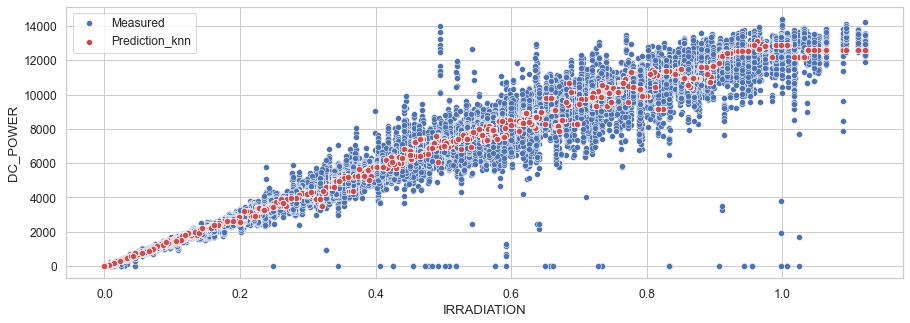

In [139]:
sns.scatterplot(df_test.IRRADIATION, df_test.DC_POWER, label="Measured")

# visualize between input vs predicted values
sns.scatterplot(df_test.IRRADIATION, df_test.Prediction_knn, color="r", label="Prediction_knn")

<AxesSubplot:xlabel='DC_POWER', ylabel='Prediction_knn'>

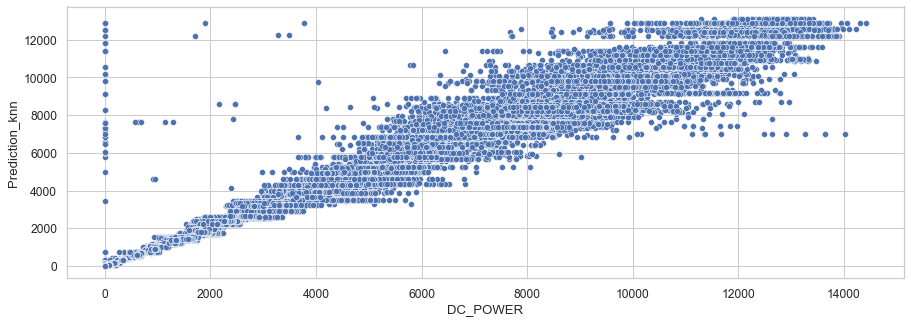

In [140]:
sns.scatterplot(data = df_test, x = "DC_POWER", y = "Prediction_knn" )

Here we can see KNN model also predicted values for the incidents where actual value of DC_POWER is zero.

But let's check for which model those number of prediction is less - 

In [141]:
df_test[(df_test.DC_POWER == 0) & (df_test.Prediction_knn >0)]

,DATE_TIME,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION,SENSOR_NUM,...,MINUTES,MINUTES_PASS,DATE_STR,STATUS,Prediction_lr,Residual_lr,Residual_abs_lr,Prediction_knn,Residual_knn,Residual_abs_knn
515,2020-05-15 06:00:00,VHMLBKoKgIrUVDU,0.0,0.0,0.0,7206408.0,24.088446,22.206757,0.005887,6,...,0,360,2020-05-15,Fault,136.105130,136.105130,136.105130,52.775000,52.775000,52.775000
815,2020-05-15 09:15:00,zVJPv84UY57bAof,0.0,0.0,711.0,7116862.0,27.988362,46.617706,0.344884,21,...,15,555,2020-05-15,Fault,4676.932612,4676.932612,4676.932612,4960.546429,4960.546429,4960.546429
837,2020-05-15 09:30:00,zVJPv84UY57bAof,0.0,0.0,711.0,7116862.0,27.516728,39.136326,0.249248,21,...,30,570,2020-05-15,Fault,3395.904100,3395.904100,3395.904100,3450.457143,3450.457143,3450.457143
14770,2020-05-22 18:30:00,1BY6WEcLGh8j5v7,0.0,0.0,6848.0,6312437.0,28.038025,26.626117,0.002003,1,...,30,1110,2020-05-22,Normal,84.074356,84.074356,84.074356,1.800000,1.800000,1.800000
14771,2020-05-22 18:30:00,1IF53ai7Xc0U56Y,0.0,0.0,7287.0,6240534.0,28.038025,26.626117,0.002003,2,...,30,1110,2020-05-22,Normal,84.074356,84.074356,84.074356,1.800000,1.800000,1.800000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67209,2020-06-17 06:00:00,z9Y9gH1T5YWrNuG,0.0,0.0,0.0,7245385.0,21.695500,20.599559,0.002842,15,...,0,360,2020-06-17,Fault,95.324448,95.324448,95.324448,1.800000,1.800000,1.800000
67210,2020-06-17 06:00:00,zBIq5rxdHJRwDNY,0.0,0.0,0.0,6577552.0,21.695500,20.599559,0.002842,16,...,0,360,2020-06-17,Fault,95.324448,95.324448,95.324448,1.800000,1.800000,1.800000
67211,2020-06-17 06:00:00,zVJPv84UY57bAof,0.0,0.0,0.0,7357362.0,21.695500,20.599559,0.002842,17,...,0,360,2020-06-17,Fault,95.324448,95.324448,95.324448,1.800000,1.800000,1.800000
67223,2020-06-17 06:45:00,bvBOhCH3iADSZry,0.0,0.0,0.0,6533549.0,22.335686,23.154515,0.045348,22,...,45,405,2020-06-17,Fault,664.675262,664.675262,664.675262,735.839286,735.839286,735.839286


In [142]:
df_test[(df_test.DC_POWER == 0) & (df_test.Prediction_lr >0)]

,DATE_TIME,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION,SENSOR_NUM,...,MINUTES,MINUTES_PASS,DATE_STR,STATUS,Prediction_lr,Residual_lr,Residual_abs_lr,Prediction_knn,Residual_knn,Residual_abs_knn
0,2020-05-15 00:00:00,1BY6WEcLGh8j5v7,0.0,0.0,0.000,6259559.0,25.184316,22.857507,0.0,1,...,0,0,2020-05-15,Normal,57.250005,57.250005,57.250005,0.0,0.0,0.0
1,2020-05-15 00:00:00,1IF53ai7Xc0U56Y,0.0,0.0,0.000,6183645.0,25.184316,22.857507,0.0,2,...,0,0,2020-05-15,Normal,57.250005,57.250005,57.250005,0.0,0.0,0.0
2,2020-05-15 00:00:00,3PZuoBAID5Wc2HD,0.0,0.0,0.000,6987759.0,25.184316,22.857507,0.0,3,...,0,0,2020-05-15,Normal,57.250005,57.250005,57.250005,0.0,0.0,0.0
3,2020-05-15 00:00:00,7JYdWkrLSPkdwr4,0.0,0.0,0.000,7602960.0,25.184316,22.857507,0.0,4,...,0,0,2020-05-15,Normal,57.250005,57.250005,57.250005,0.0,0.0,0.0
4,2020-05-15 00:00:00,McdE0feGgRqW7Ca,0.0,0.0,0.000,7158964.0,25.184316,22.857507,0.0,5,...,0,0,2020-05-15,Normal,57.250005,57.250005,57.250005,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68725,2020-06-17 23:45:00,uHbuxQJl8lW7ozc,0.0,0.0,5967.000,7287002.0,21.909288,20.427972,0.0,13,...,45,1425,2020-06-17,Normal,57.250005,57.250005,57.250005,0.0,0.0,0.0
68726,2020-06-17 23:45:00,wCURE6d3bPkepu2,0.0,0.0,5147.625,7028601.0,21.909288,20.427972,0.0,14,...,45,1425,2020-06-17,Normal,57.250005,57.250005,57.250005,0.0,0.0,0.0
68727,2020-06-17 23:45:00,z9Y9gH1T5YWrNuG,0.0,0.0,5819.000,7251204.0,21.909288,20.427972,0.0,15,...,45,1425,2020-06-17,Normal,57.250005,57.250005,57.250005,0.0,0.0,0.0
68728,2020-06-17 23:45:00,zBIq5rxdHJRwDNY,0.0,0.0,5817.000,6583369.0,21.909288,20.427972,0.0,16,...,45,1425,2020-06-17,Normal,57.250005,57.250005,57.250005,0.0,0.0,0.0


In [143]:
print(len(df_test[(df_test.DC_POWER == 0) & (df_test.Prediction_knn >0)]))

print(len(df_test[(df_test.DC_POWER == 0) & (df_test.Prediction_lr >0)]))

194
26694


In [144]:
print(f"For zero DC_POWER values, linear model predicted values for {len(df_test[(df_test.DC_POWER == 0) & (df_test.Prediction_knn >0)])} times, while KNN model predicted for {len(df_test[(df_test.DC_POWER == 0) & (df_test.Prediction_lr >0)])} times.It means that KNN Model performed much better for the data in which actual value of DC Power is zero.  ")

For zero DC_POWER values, linear model predicted values for 194 times, while KNN model predicted for 26694 times.It means that KNN Model performed much better for the data in which actual value of DC Power is zero.  


In [145]:
df_test[df_test.DC_POWER == 0]['Prediction_knn'].value_counts()

0.000000        26500
1.800000           82
130.071429         22
335.925000         11
146.942857         10
12879.532144        8
11394.400000        7
12528.635714        6
12866.875000        6
6550.250000         3
735.839286          2
5969.464286         2
11853.280000        2
10197.742856        2
10579.789286        2
7577.321429         2
7291.939286         2
6445.589286         2
9788.075000         2
7229.546428         2
6055.575000         2
8292.275000         2
9101.153571         2
6973.900000         1
6859.810714         1
130.885714          1
382.764286          1
7638.475000         1
52.775000           1
4960.546429         1
3450.457143         1
12196.428572        1
51.364286           1
85.307143           1
93.442857           1
5781.189286         1
Name: Prediction_knn, dtype: int64

In [146]:
print(f"KNN model predicted {(df_test[df_test.DC_POWER == 0]['Prediction_knn'].value_counts()[0]/df_test[df_test.DC_POWER == 0]['Prediction_knn'].value_counts().sum())*100} % correct values for data having zero DC power.")

KNN model predicted 99.27324492395296 % correct values for data having zero DC power.


In [147]:
log_Prediction = np.log(df_test.Prediction_knn)
irradiation = df_test.IRRADIATION
log_DC_POWER = np.log(df_test.DC_POWER)

<AxesSubplot:xlabel='IRRADIATION', ylabel='DC_POWER'>

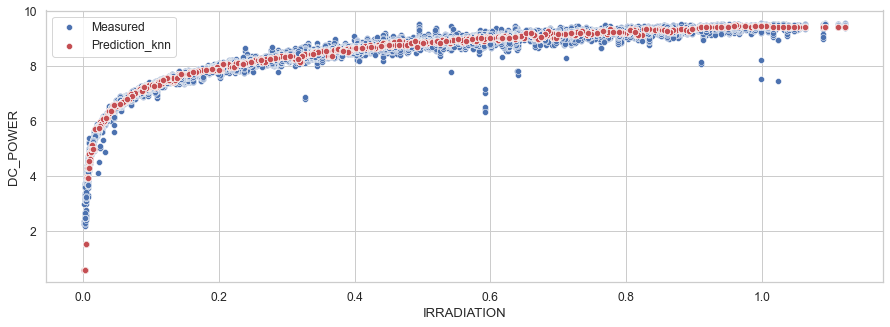

In [148]:
sns.scatterplot(irradiation, log_DC_POWER, label="Measured")
sns.scatterplot(irradiation, log_Prediction, color="r", label="Prediction_knn")

It can be seen in the plot above, that knn model predicted zero values for zero DC POWER levels, which means KNN Model did well.

<AxesSubplot:xlabel='DC_POWER', ylabel='Prediction_knn'>

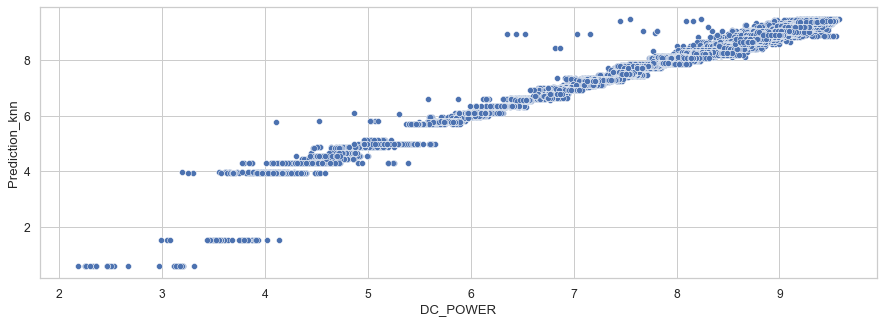

In [149]:
sns.scatterplot(x = log_DC_POWER, y = log_Prediction)
# Visualization between target values and predicted values

### Calculating the efficienty :-

In [150]:
inp = np.array(df_test['IRRADIATION'])
targ = np.array(df_test['DC_POWER'])

In [151]:
inp = inp.reshape(-1,1)
targ = targ.reshape(-1,1)

In [152]:
knn.score(inp,targ)

0.9766568411920199

In [153]:
reg.score(inp,targ)

0.9774532910566022

We can see the efficiency of Linear Regression and KNN Regression is same.

<a id="section-five"></a>
# 5. Summary


* **Challenge 1:** Prediction of power generation by Linear regression and KNN regression were equally efficient if we look at their efficiency, but KNN Model predicted more accurately for the inputs where the irradiation levels were zero.
Therefore we should go for KNN Model for prediction.

* **Challenge 2&3:** Successfully identified **events of equipment failure and underperformance** with a rule-based method and linear modeling of the relationship between irradiation, temperature and DC power. This approach can be useful for real-time condition monitoring and fault detection.

### Thank you !